In [1]:
import tensorflow as tf
from tensorflow.keras import Model, Input, metrics
from tensorflow.keras import layers #Conv2D, Layer, BatchNormalization, Activation
from tensorflow.keras import optimizers #Adam
from tensorflow.keras import backend
from tensorflow.python.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
%load_ext tensorboard
from tensorboard import notebook
import datetime,os
import PrepareData
import numpy as np

In [2]:
class MaxPoolingWithArgmax2D(layers.Layer):
    def __init__(self, pool_size=(2, 2), strides=(2, 2), padding='same', **kwargs):
        super(MaxPoolingWithArgmax2D, self).__init__(**kwargs)
        self.padding = padding
        self.pool_size = pool_size
        self.strides = strides

    def call(self, inputs, **kwargs):
        padding = self.padding
        pool_size = self.pool_size
        strides = self.strides
        if backend.backend() == 'tensorflow':
            ksize = [1, pool_size[0], pool_size[1], 1]
            padding = padding.upper()
            strides = [1, strides[0], strides[1], 1]
            output, argmax = tf.nn.max_pool_with_argmax(inputs, ksize=ksize, strides=strides, padding=padding)
        else:
            errmsg = '{} backend is not supported for layer {}'.format(backend.backend(), type(self).__name__)
            raise NotImplementedError(errmsg)
        argmax = backend.cast(argmax, backend.floatx())
        return [output, argmax]

    def compute_output_shape(self, input_shape):
        ratio = (1, 2, 2, 1)
        output_shape = [dim // ratio[idx] if dim is not None else None for idx, dim in enumerate(input_shape)]
        output_shape = tuple(output_shape)
        return [output_shape, output_shape]

    def compute_mask(self, inputs, mask=None):
        return 2 * [None]

In [3]:
class MaxUnpooling2D(layers.Layer):
    def __init__(self, size=(2, 2), **kwargs):
        super(MaxUnpooling2D, self).__init__(**kwargs)
        self.size = size

    def call(self, inputs, output_shape=None):
        updates, mask = inputs[0], inputs[1]
        with tf.compat.v1.variable_scope(self.name):
            mask = backend.cast(mask, 'int32')
            input_shape = tf.shape(updates, out_type='int32')
            #  calculation new shape
            if output_shape is None:
                output_shape = (input_shape[0], input_shape[1] * self.size[0], input_shape[2] * self.size[1], input_shape[3])
                self.output_shape1 = output_shape

        # calculation indices for batch, height, width and feature maps
        one_like_mask = backend.ones_like(mask, dtype='int32')
        batch_shape = backend.concatenate([[input_shape[0]], [1], [1], [1]], axis=0)
        batch_range = backend.reshape(tf.range(output_shape[0], dtype='int32'), shape=batch_shape)
        b = one_like_mask * batch_range
        y = mask // (output_shape[2] * output_shape[3])
        x = (mask // output_shape[3]) % output_shape[2]
        feature_range = tf.range(output_shape[3], dtype='int32')
        f = one_like_mask * feature_range

        # transpose indices & reshape update values to one dimension
        updates_size = tf.size(updates)
        indices = backend.transpose(backend.reshape(backend.stack([b, y, x, f]), [4, updates_size]))
        values = backend.reshape(updates, [updates_size])
        ret = tf.scatter_nd(indices, values, output_shape)
        return ret

    def compute_output_shape(self, input_shape):
        mask_shape = input_shape[1]
        return mask_shape[0], mask_shape[1] * self.size[0], mask_shape[2] * self.size[1], mask_shape[3]

In [4]:

def iou(y_true, y_pred, label=1):
    """
    Return the Intersection over Union (IoU) for a given label.
    Args:
        y_true: the expected y values as a one-hot
        y_pred: the predicted y values as a one-hot or softmax output
        label: the label to return the IoU for
    Returns:
        the IoU for the given label
    """
    # extract the label values using the argmax operator then
    # calculate equality of the predictions and truths to the label
    y_true = backend.cast(backend.equal(backend.argmax(y_true), label), backend.floatx())
    y_pred = backend.cast(backend.equal(backend.argmax(y_pred), label), backend.floatx())
    # calculate the |intersection| (AND) of the labels
    intersection = backend.sum(y_true * y_pred)
    # calculate the |union| (OR) of the labels
    union = backend.sum(y_true) + backend.sum(y_pred) - intersection
    # avoid divide by zero - if the union is zero, return 1
    # otherwise, return the intersection over union
    return backend.switch(backend.equal(union, 0), 1.0, intersection / union)

In [5]:
tb = TensorBoard(log_dir='logs4', write_graph=True)
mc = ModelCheckpoint(mode='max', filepath='vgg16_segnet_4.h5', monitor='iou', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='min', monitor='val_loss', patience=50, verbose=1)
callbacks = [tb, mc, es]

In [6]:
def SegNet(input_shape, n_labels=2, kernel=3, pool_size=(2, 2), output_mode="softmax", model_summary=None):
    # encoder
    inputs = Input(shape=input_shape, batch_size=8)

    conv_1 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(inputs)
    conv_1 = layers.BatchNormalization()(conv_1)
    conv_1 = layers.Activation("relu")(conv_1)
    conv_2 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_1)
    conv_2 = layers.BatchNormalization()(conv_2)
    conv_2 = layers.Activation("relu")(conv_2)

    pool_1, mask_1 = MaxPoolingWithArgmax2D(pool_size)(conv_2)

    conv_3 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_1)
    conv_3 = layers.BatchNormalization()(conv_3)
    conv_3 = layers.Activation("relu")(conv_3)
    conv_4 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_3)
    conv_4 = layers.BatchNormalization()(conv_4)
    conv_4 = layers.Activation("relu")(conv_4)

    pool_2, mask_2 = MaxPoolingWithArgmax2D(pool_size)(conv_4)

    conv_5 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_2)
    conv_5 = layers.BatchNormalization()(conv_5)
    conv_5 = layers.Activation("relu")(conv_5)
    conv_6 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_5)
    conv_6 = layers.BatchNormalization()(conv_6)
    conv_6 = layers.Activation("relu")(conv_6)
    conv_7 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_6)
    conv_7 = layers.BatchNormalization()(conv_7)
    conv_7 = layers.Activation("relu")(conv_7)

    pool_3, mask_3 = MaxPoolingWithArgmax2D(pool_size)(conv_7)

    conv_8 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_3)
    conv_8 = layers.BatchNormalization()(conv_8)
    conv_8 = layers.Activation("relu")(conv_8)
    conv_9 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_8)
    conv_9 = layers.BatchNormalization()(conv_9)
    conv_9 = layers.Activation("relu")(conv_9)
    conv_10 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_9)
    conv_10 = layers.BatchNormalization()(conv_10)
    conv_10 = layers.Activation("relu")(conv_10)

    pool_4, mask_4 = MaxPoolingWithArgmax2D(pool_size)(conv_10)

    conv_11 = layers.Conv2D(1024, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_4)
    conv_11 = layers.BatchNormalization()(conv_11)
    conv_11 = layers.Activation("relu")(conv_11)
    conv_12 = layers.Conv2D(1024, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_11)
    conv_12 = layers.BatchNormalization()(conv_12)
    conv_12 = layers.Activation("relu")(conv_12)
    conv_13 = layers.Conv2D(1024, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_12)
    conv_13 = layers.BatchNormalization()(conv_13)
    conv_13 = layers.Activation("relu")(conv_13)

    pool_5, mask_5 = MaxPoolingWithArgmax2D(pool_size)(conv_13)
    print("Build enceder done..")

    # decoder
    unpool_1 = MaxUnpooling2D(pool_size)([pool_5, mask_5])

    conv_14 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_1)
    conv_14 = layers.BatchNormalization()(conv_14)
    conv_14 = layers.Activation("relu")(conv_14)
    conv_15 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_14)
    conv_15 = layers.BatchNormalization()(conv_15)
    conv_15 = layers.Activation("relu")(conv_15)
    conv_16 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_15)
    conv_16 = layers.BatchNormalization()(conv_16)
    conv_16 = layers.Activation("relu")(conv_16)

    unpool_2 = MaxUnpooling2D(pool_size)([conv_16, mask_4])

    conv_17 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_2)
    conv_17 = layers.BatchNormalization()(conv_17)
    conv_17 = layers.Activation("relu")(conv_17)
    conv_18 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_17)
    conv_18 = layers.BatchNormalization()(conv_18)
    conv_18 = layers.Activation("relu")(conv_18)
    conv_19 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_18)
    conv_19 = layers.BatchNormalization()(conv_19)
    conv_19 = layers.Activation("relu")(conv_19)

    unpool_3 = MaxUnpooling2D(pool_size)([conv_19, mask_3])

    conv_20 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_3)
    conv_20 = layers.BatchNormalization()(conv_20)
    conv_20 = layers.Activation("relu")(conv_20)
    conv_21 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_20)
    conv_21 = layers.BatchNormalization()(conv_21)
    conv_21 = layers.Activation("relu")(conv_21)
    conv_22 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_21)
    conv_22 = layers.BatchNormalization()(conv_22)
    conv_22 = layers.Activation("relu")(conv_22)

    unpool_4 = MaxUnpooling2D(pool_size)([conv_22, mask_2])

    conv_23 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_4)
    conv_23 = layers.BatchNormalization()(conv_23)
    conv_23 = layers.Activation("relu")(conv_23)
    conv_24 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_23)
    conv_24 = layers.BatchNormalization()(conv_24)
    conv_24 = layers.Activation("relu")(conv_24)

    unpool_5 = MaxUnpooling2D(pool_size)([conv_24, mask_1])

    conv_25 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_5)
    conv_25 = layers.BatchNormalization()(conv_25)
    conv_25 = layers.Activation("relu")(conv_25)

    out=layers.Conv2D(n_labels,1, activation = output_mode)(conv_25)
    print("Build decoder done..")

    model = Model(inputs=inputs, outputs=out, name="SegNet")
    model.compile(optimizer = optimizers.Adam(lr = 1e-4), loss = 'categorical_crossentropy',metrics=[iou,'accuracy'])

    if model_summary is True:
        model.summary()

    return model

Build enceder done..
Build decoder done..
Model: "SegNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(8, 256, 256, 3)]   0                                            
__________________________________________________________________________________________________
conv2d_52 (Conv2D)              (8, 256, 256, 128)   3584        input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_50 (BatchNo (8, 256, 256, 128)   512         conv2d_52[0][0]                  
__________________________________________________________________________________________________
activation_50 (Activation)      (8, 256, 256, 128)   0           batch_normalization_50[0][0]     
___________________________________________________

Found 64 images belonging to 1 classes.
Found 64 images belonging to 1 classes.
(256, 256, 3)


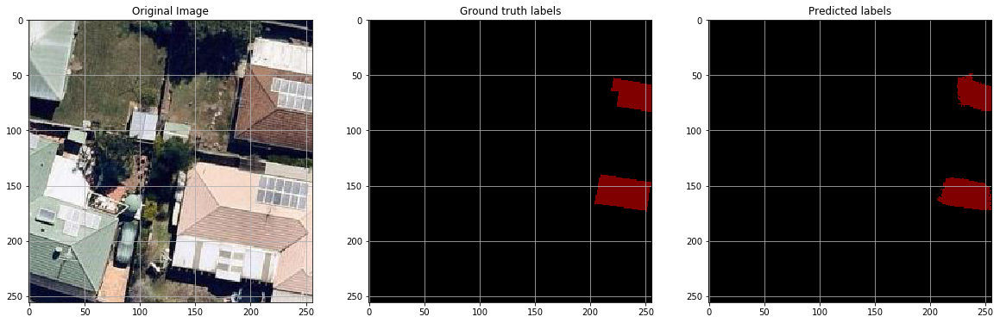

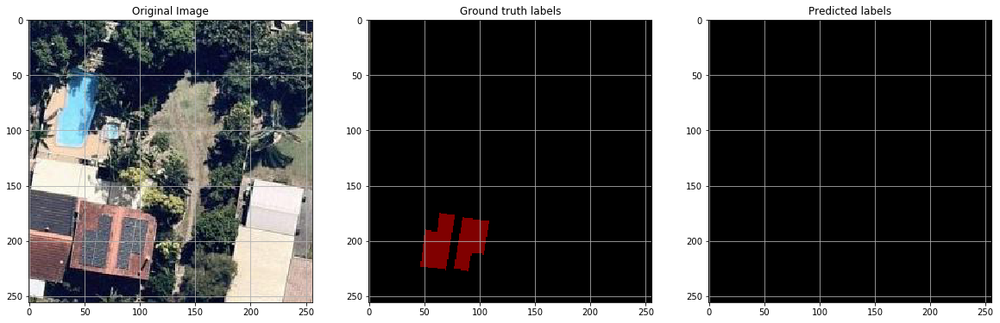

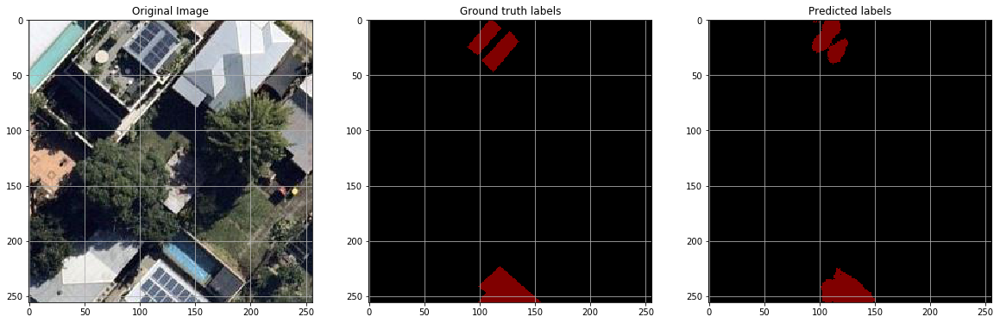

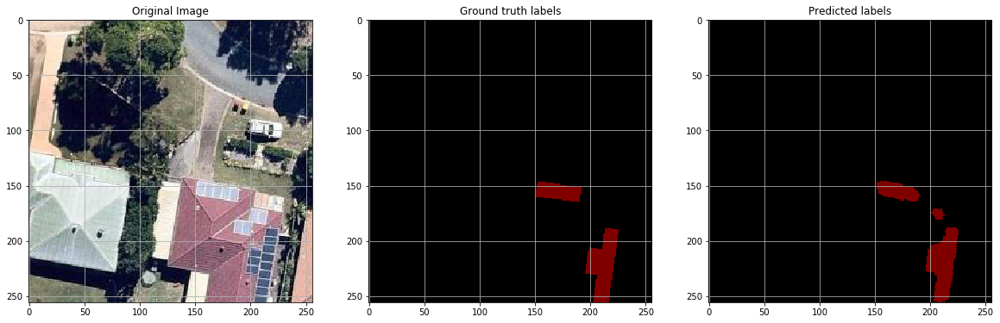

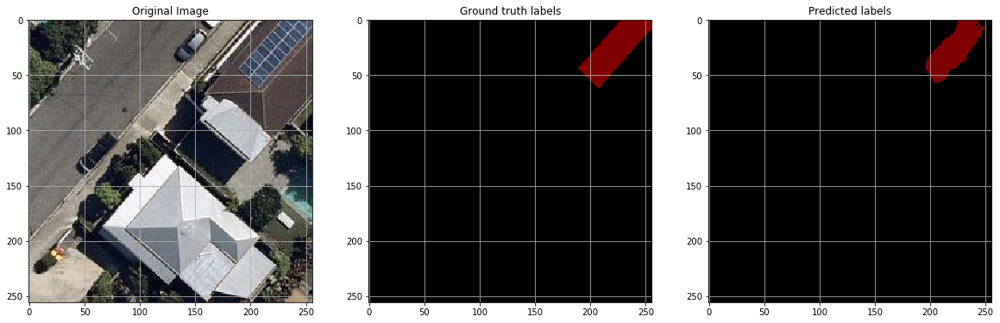

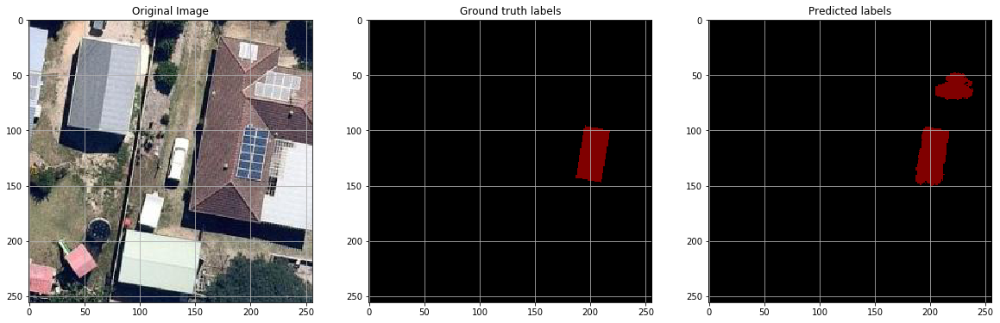

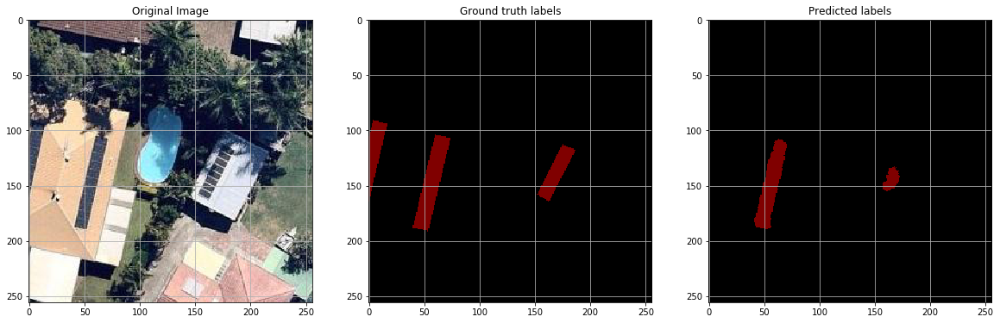

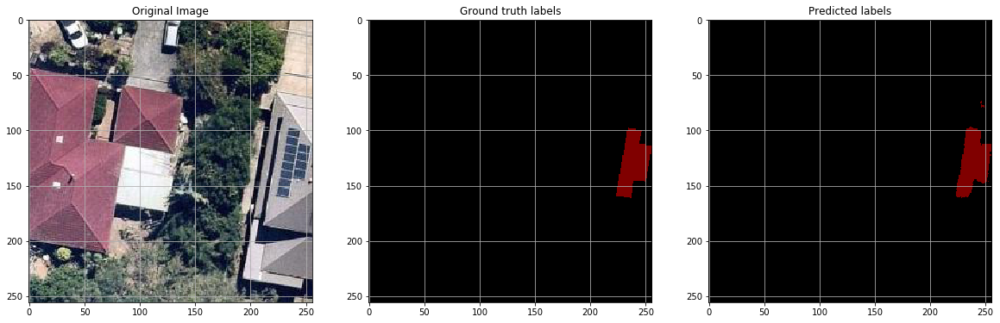

(256, 256, 3)


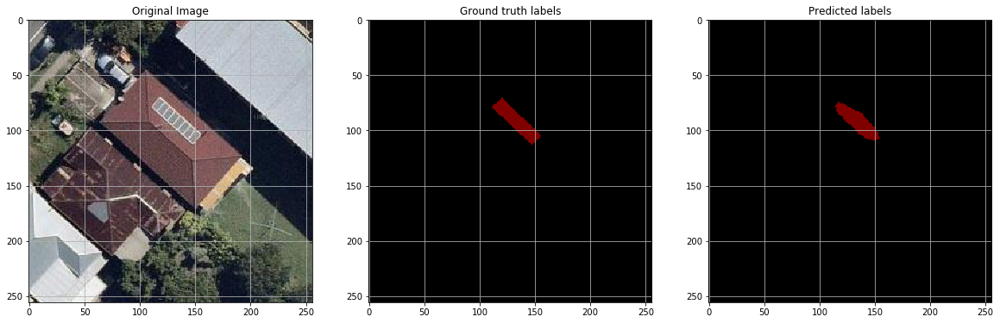

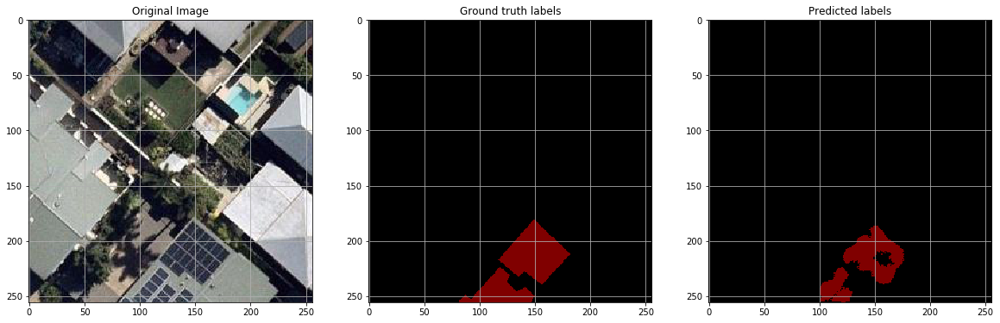

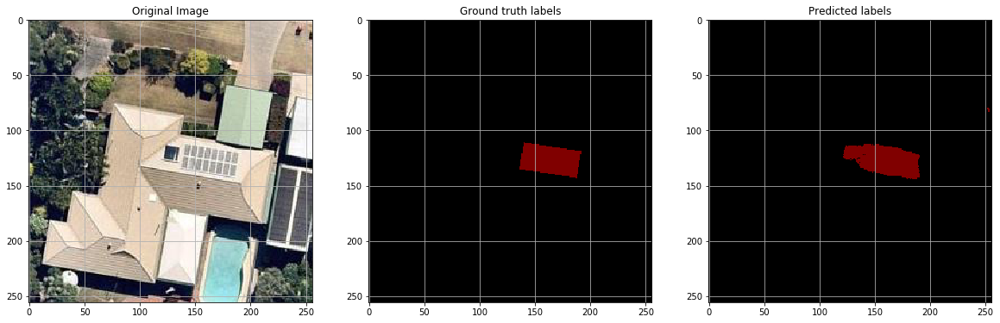

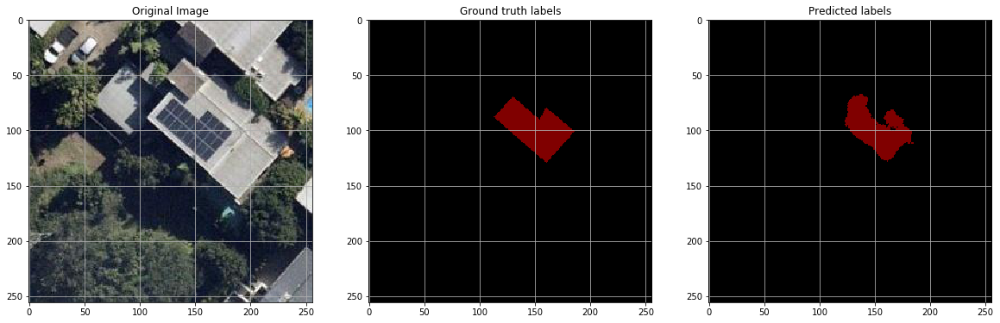

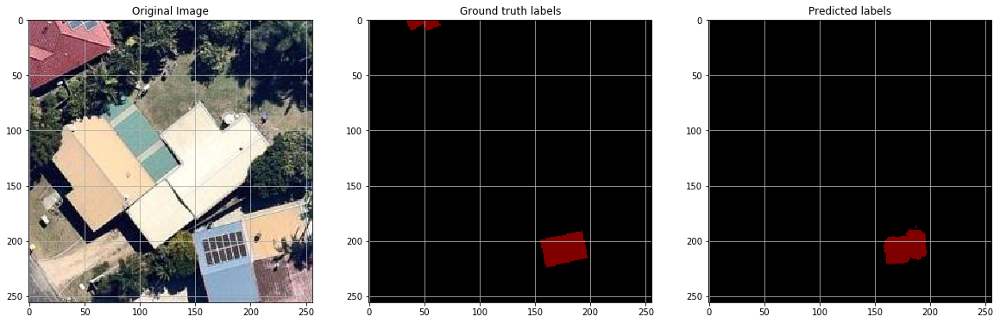

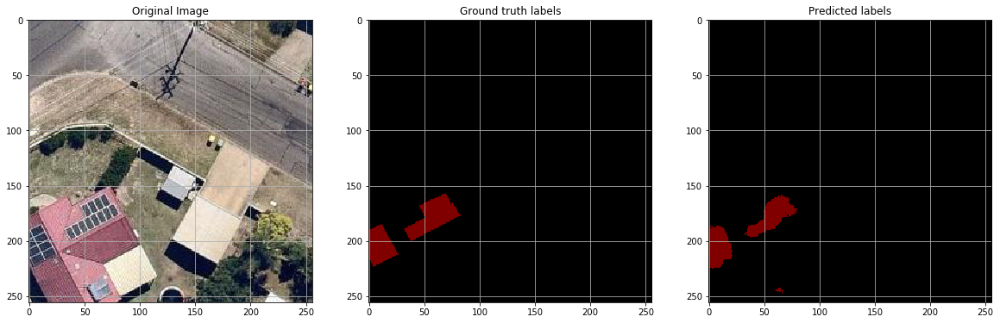

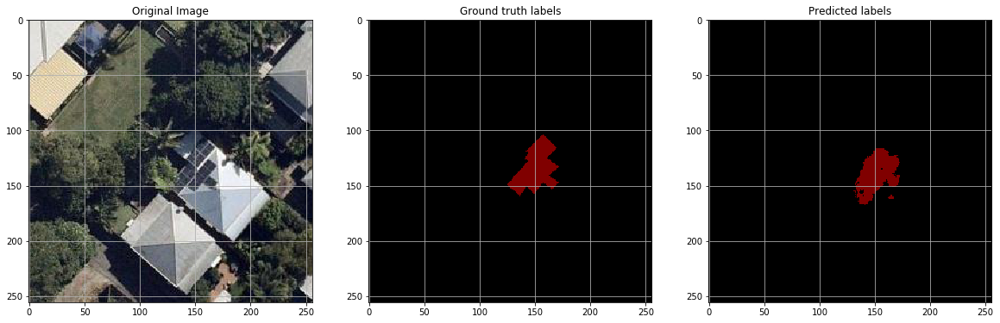

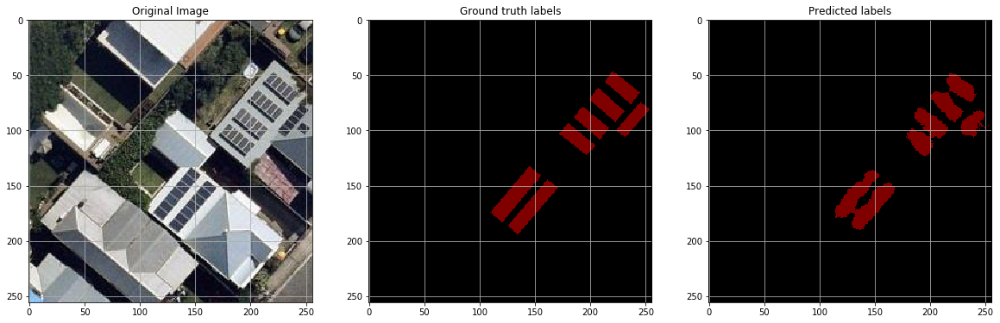

(256, 256, 3)


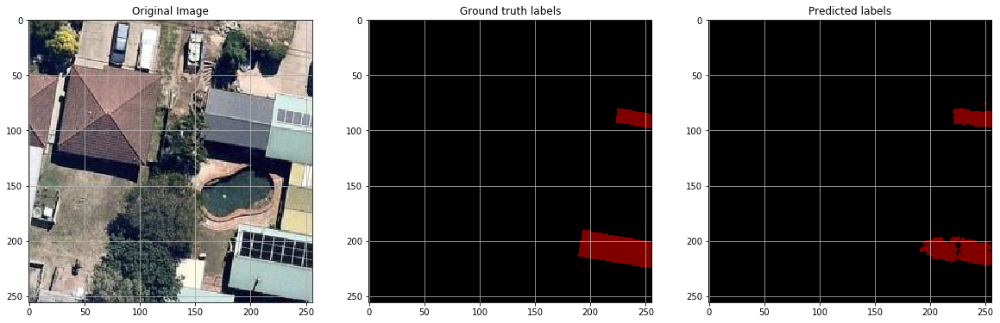

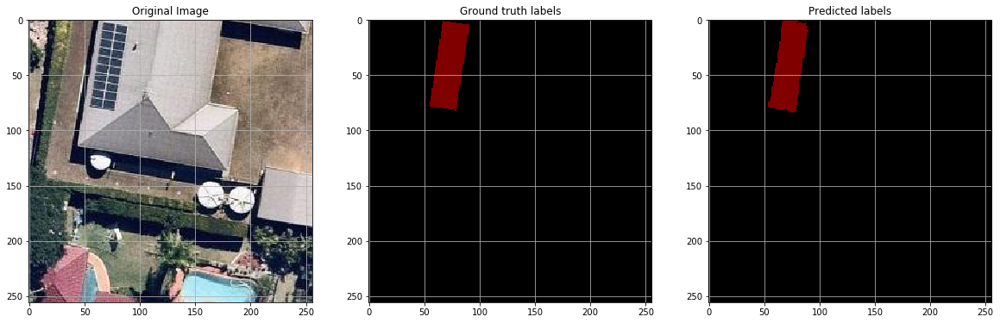

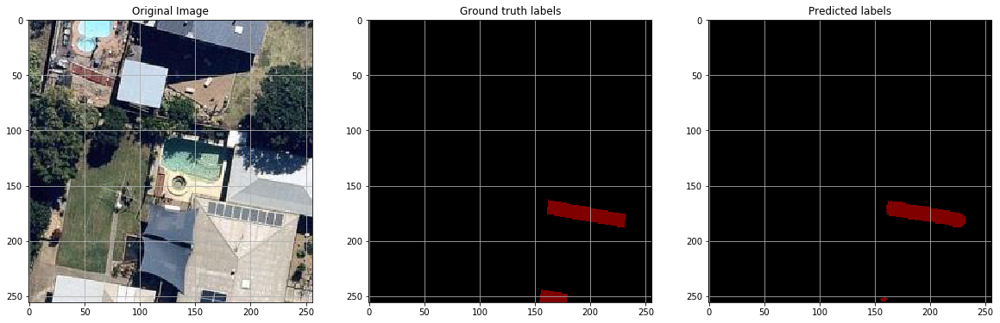

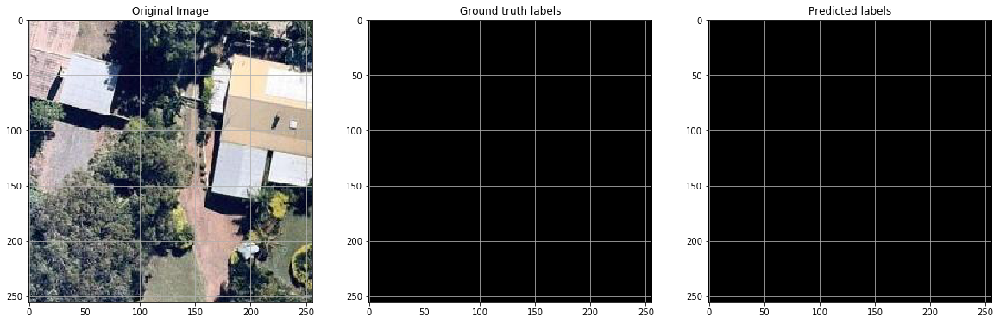

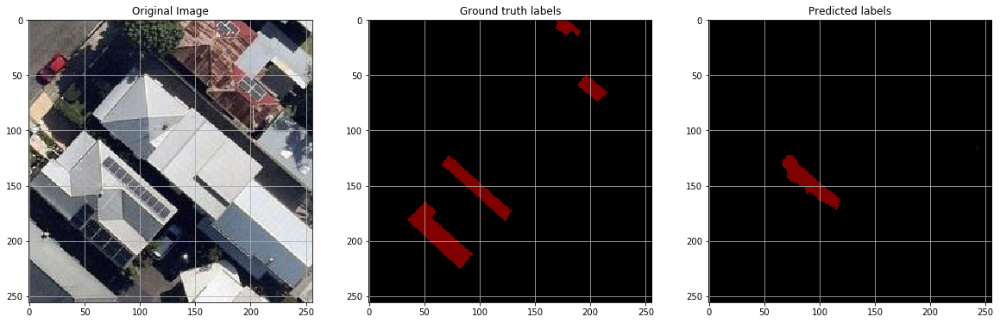

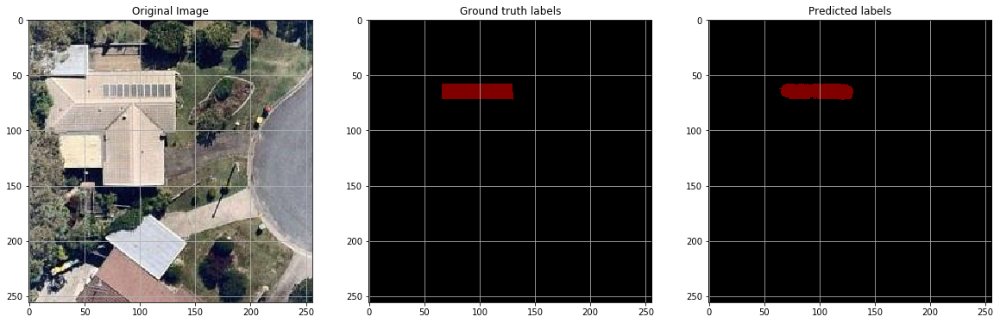

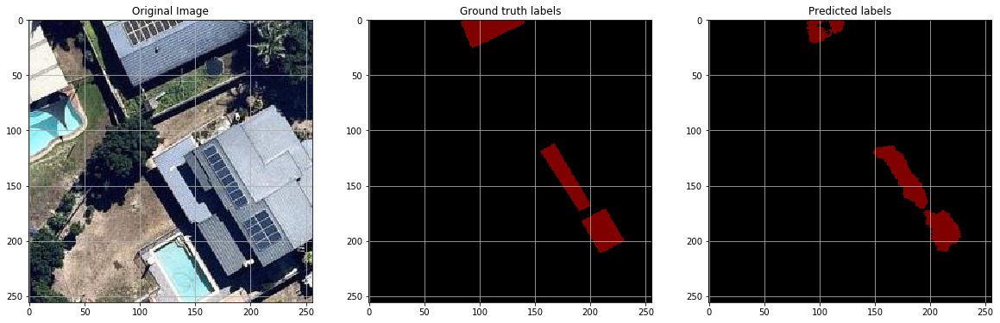

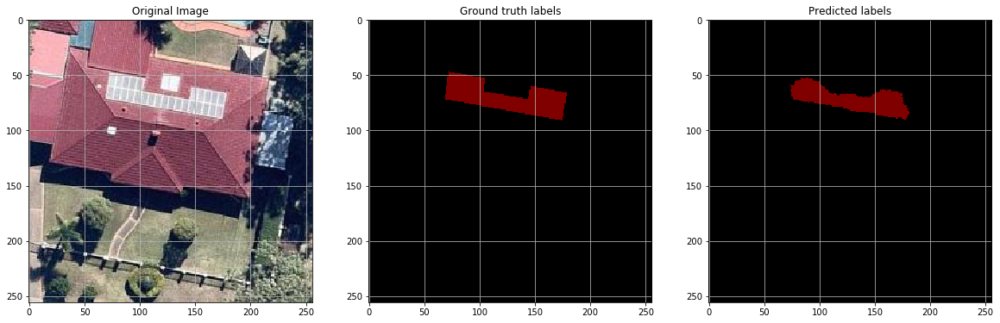

(256, 256, 3)


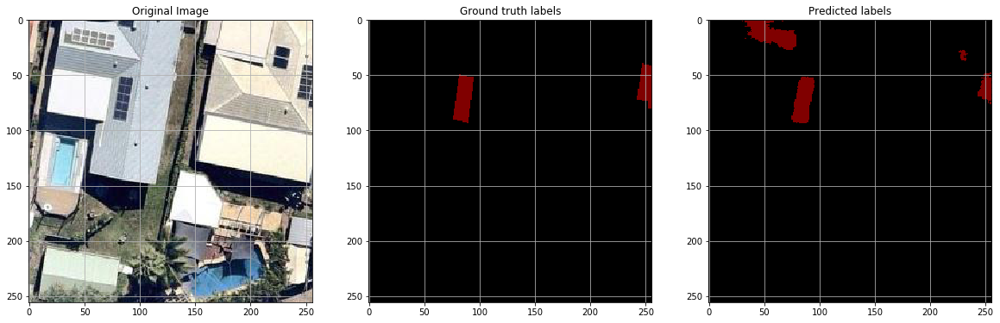

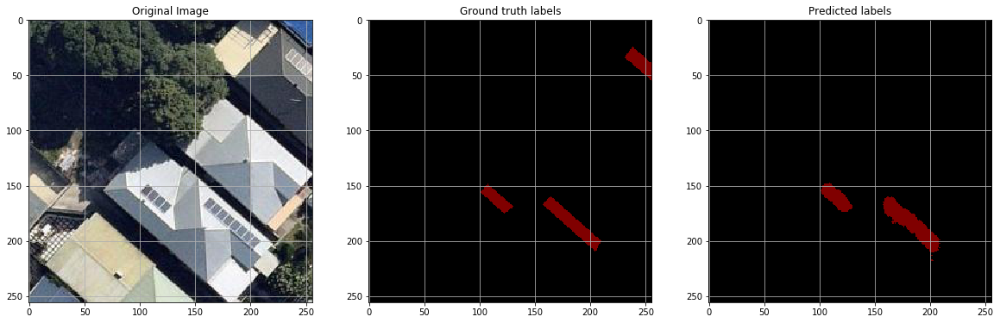

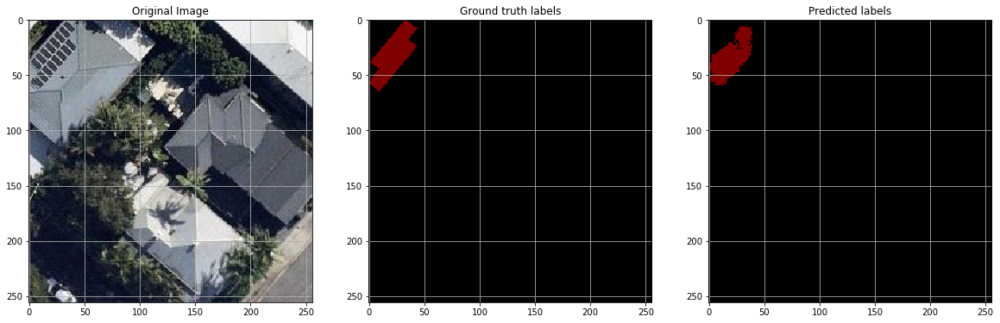

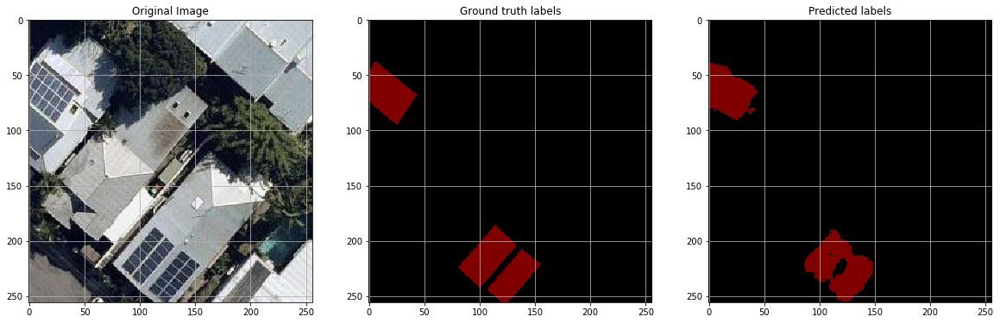

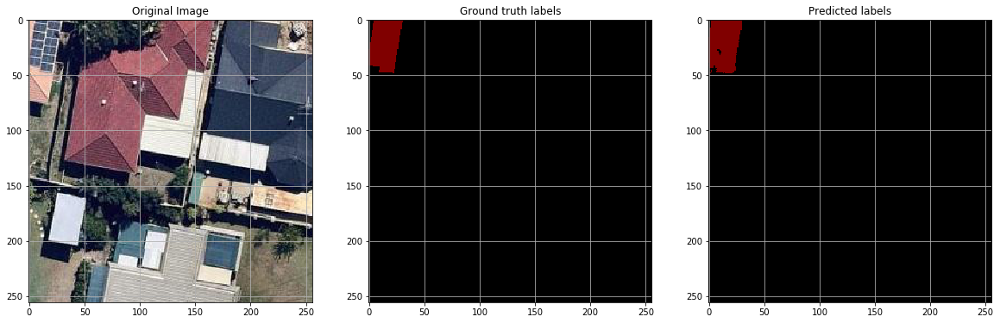

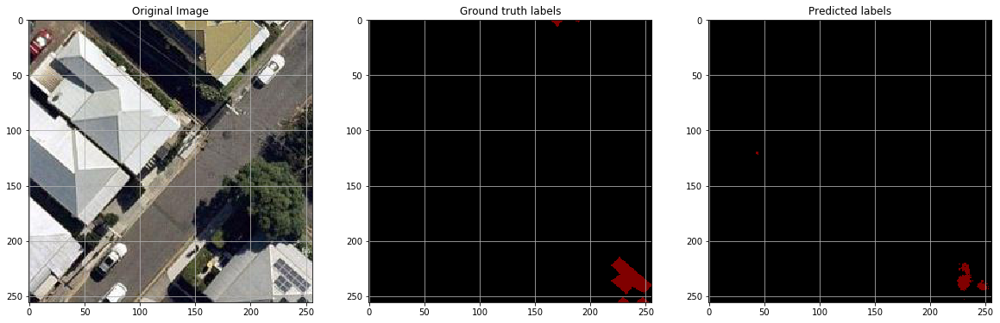

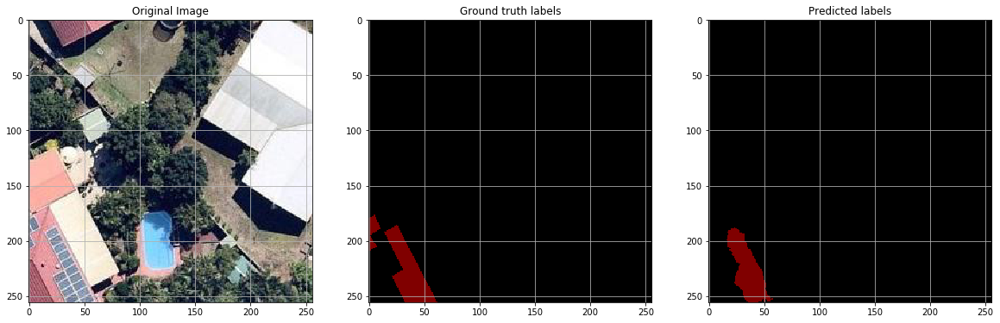

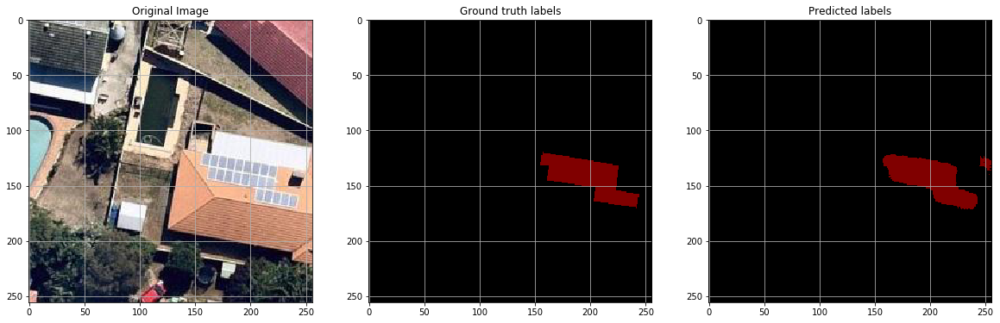

(256, 256, 3)


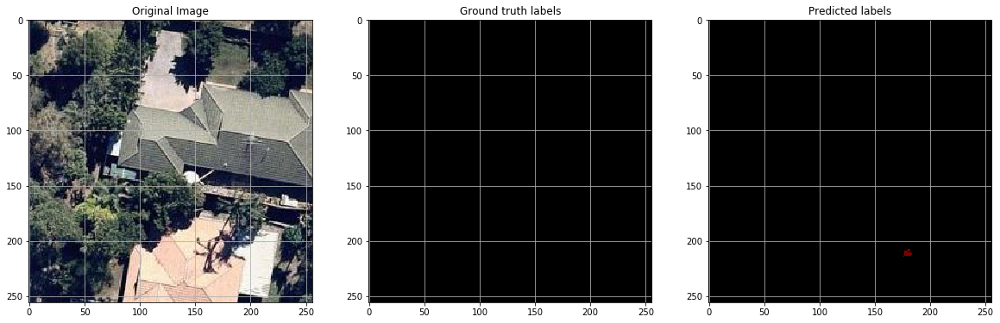

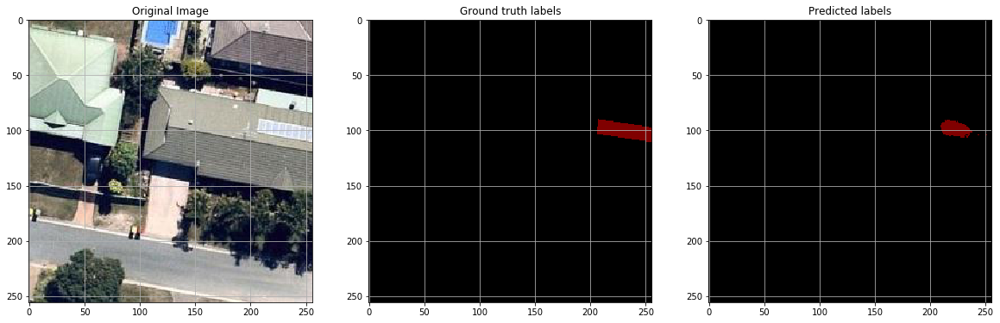

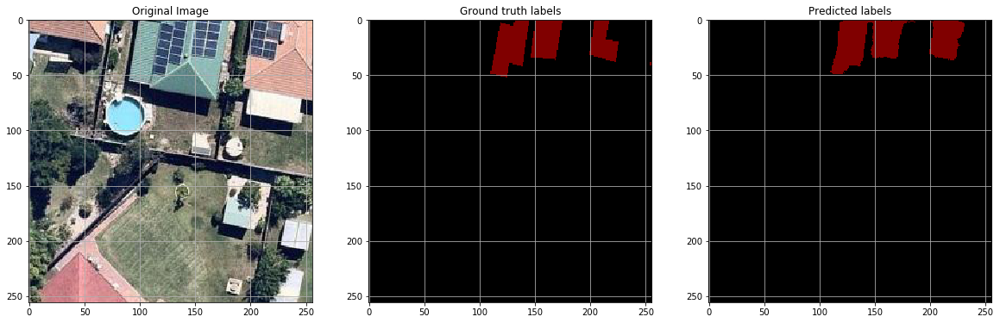

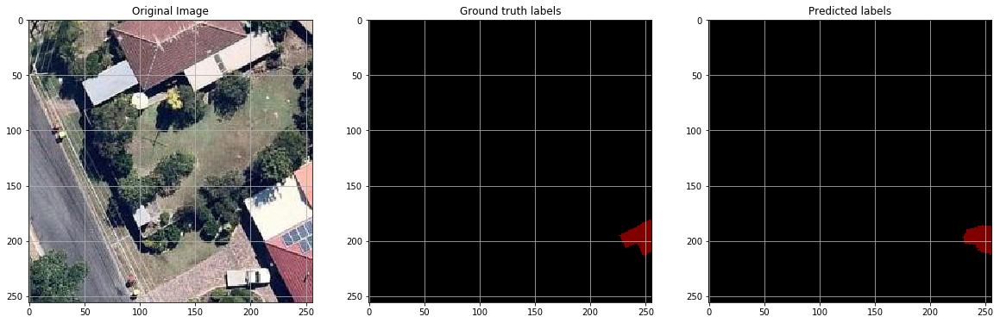

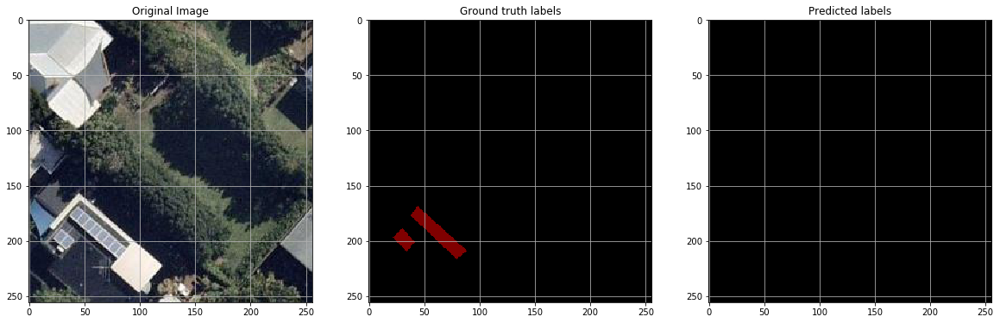

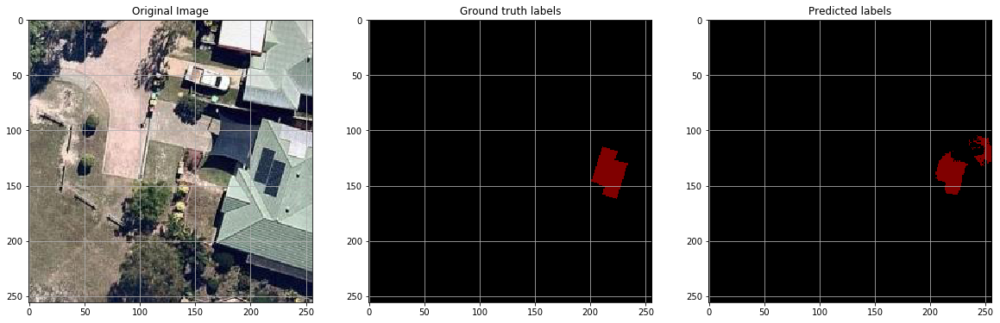

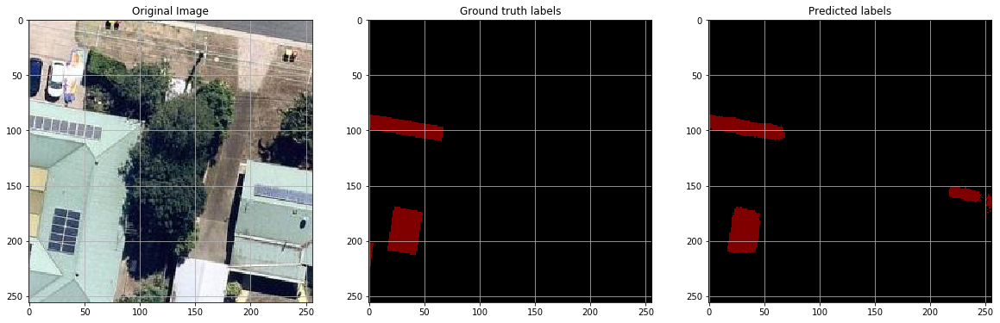

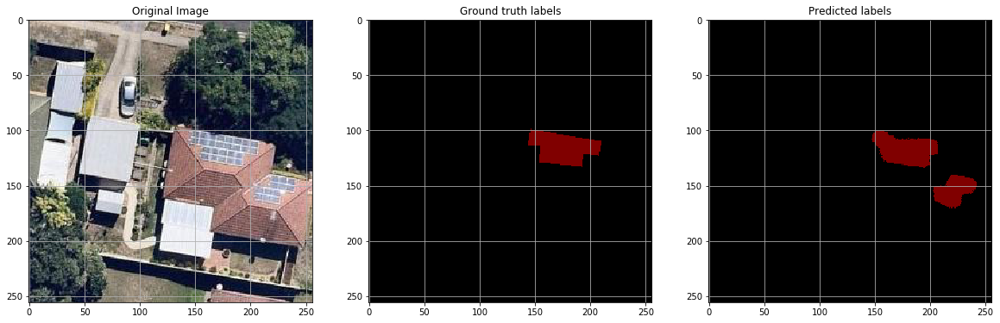

(256, 256, 3)


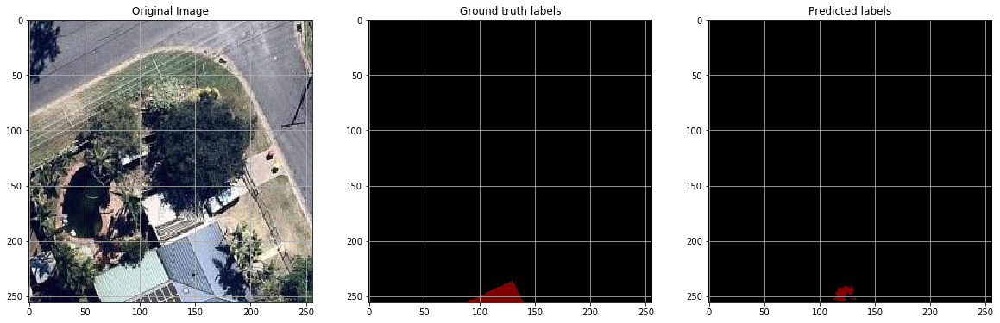

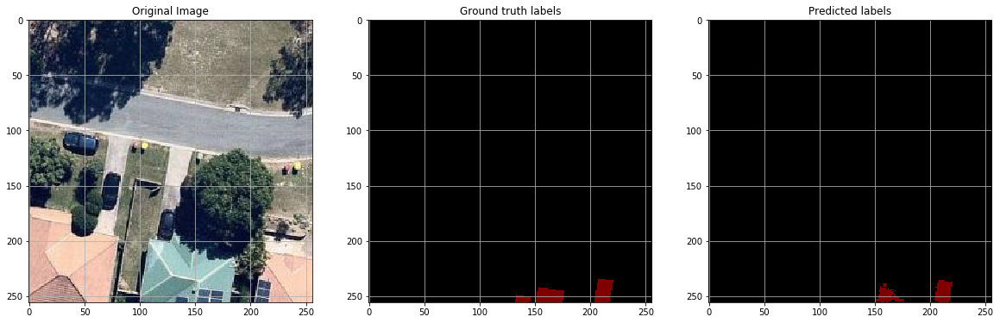

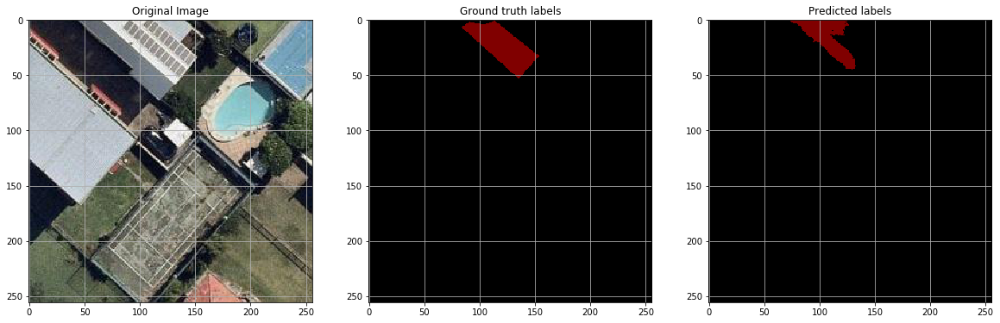

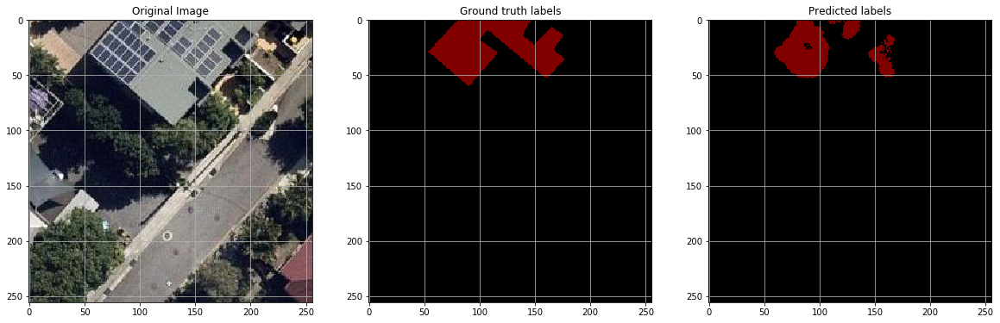

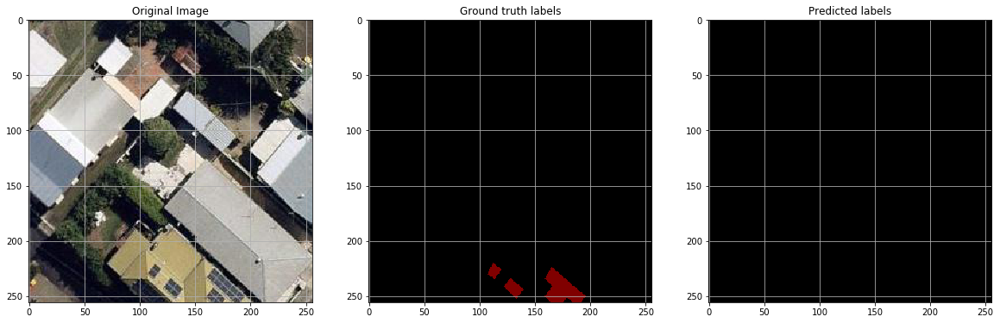

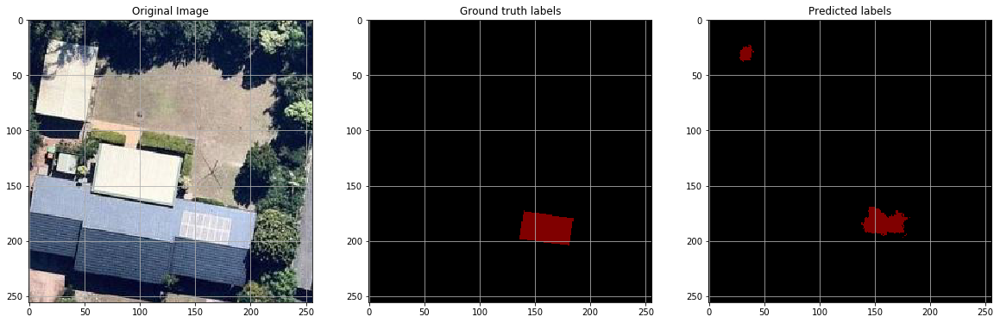

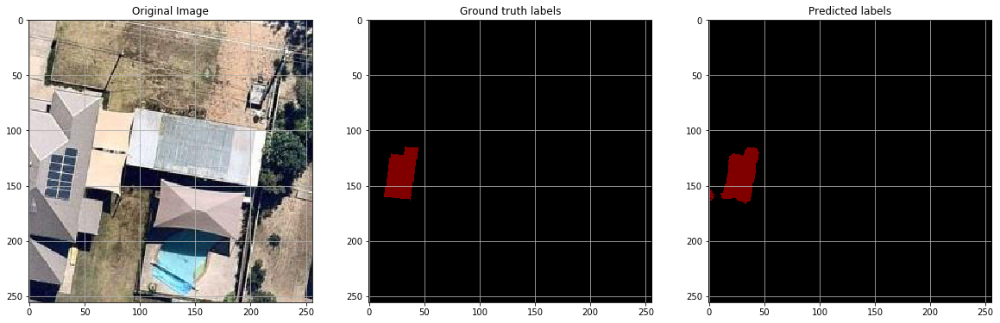

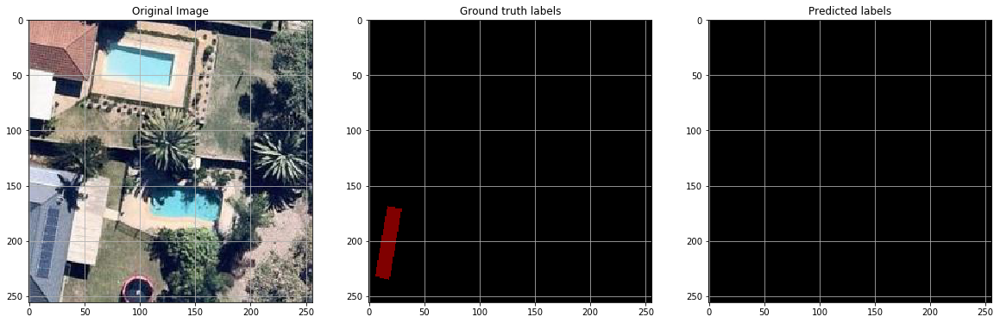

(256, 256, 3)


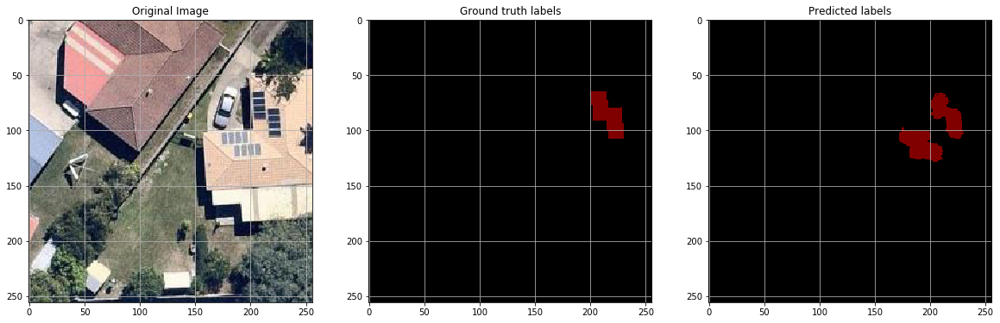

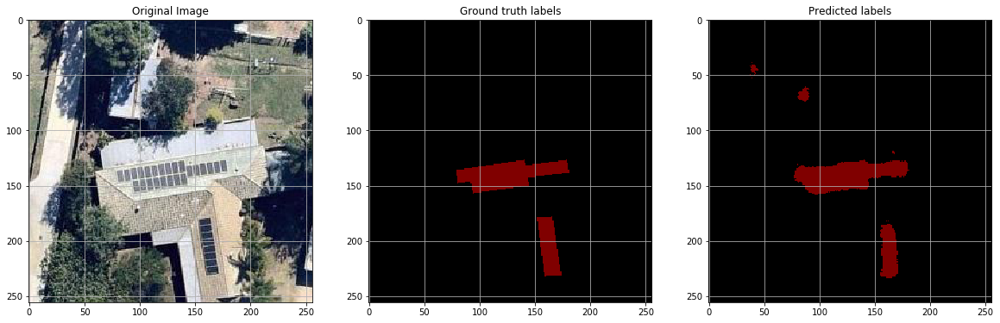

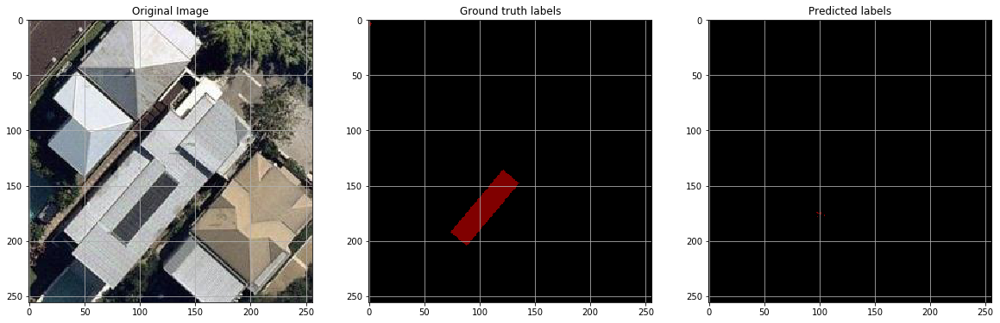

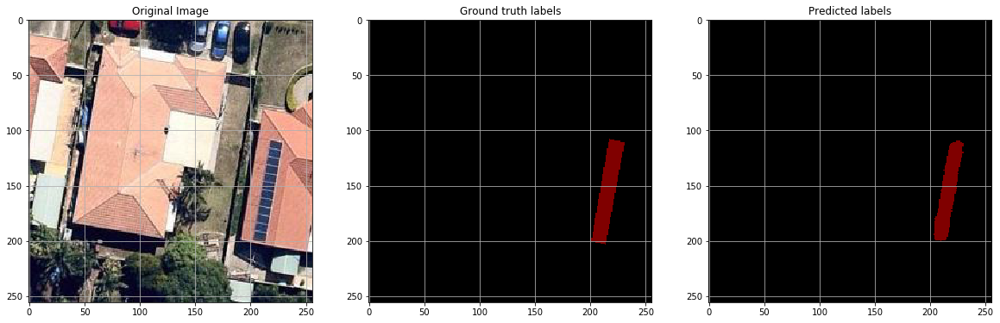

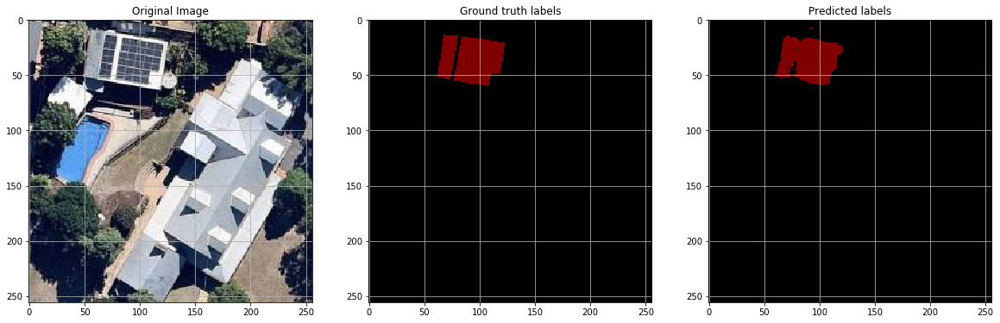

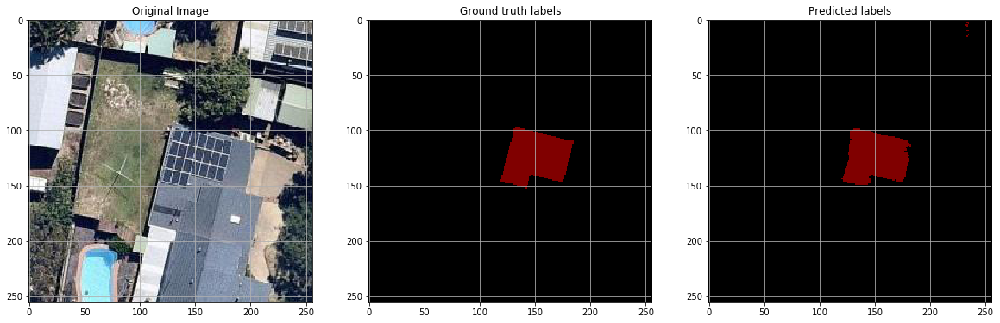

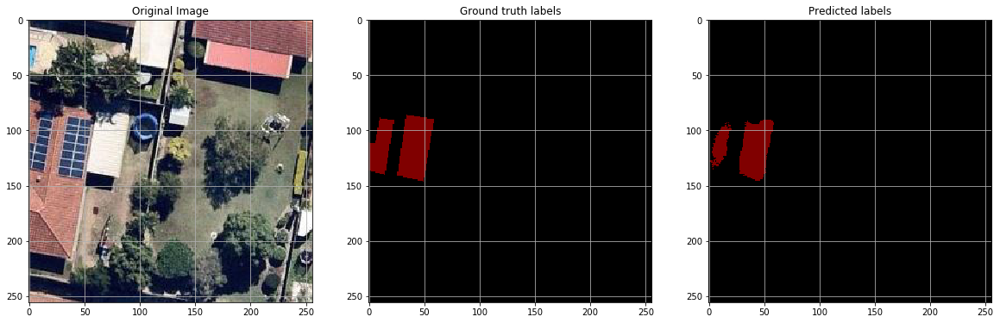

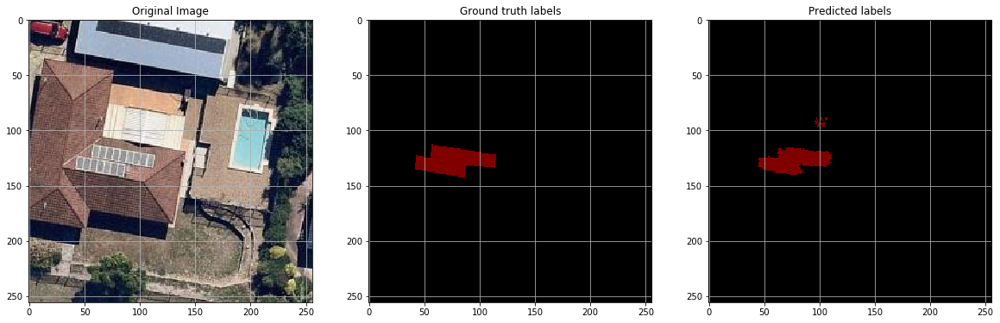

(256, 256, 3)


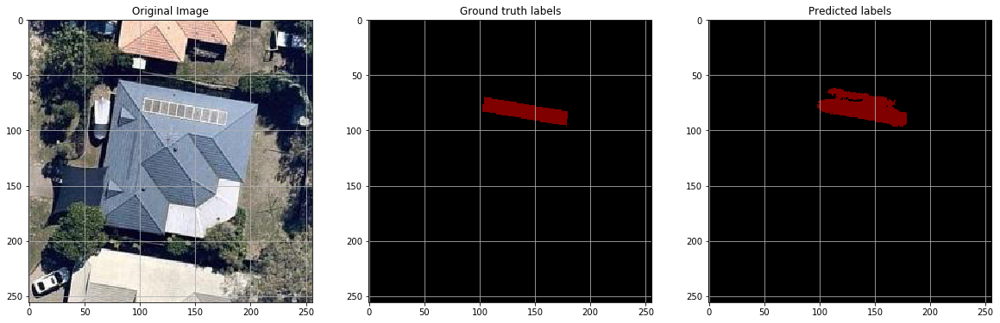

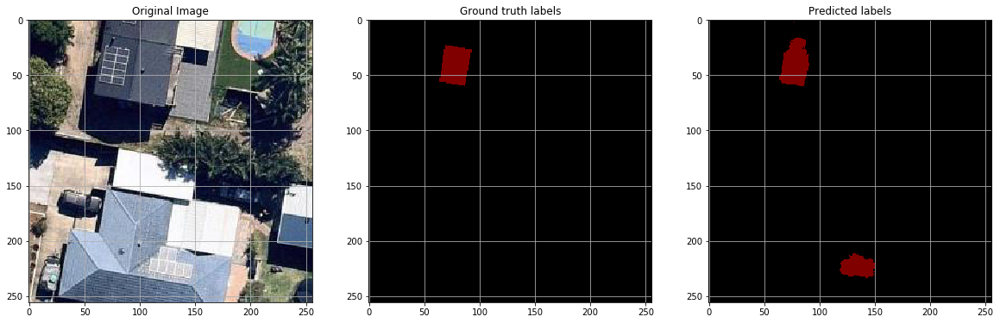

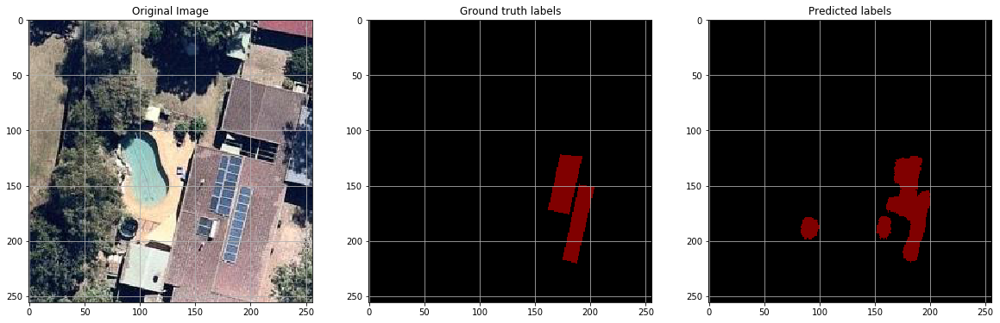

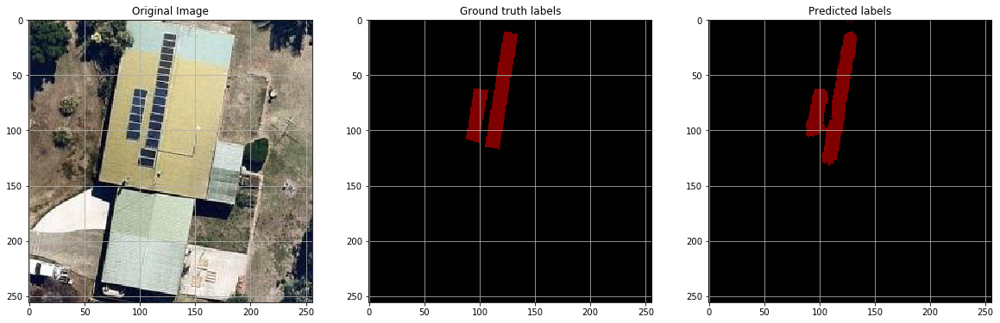

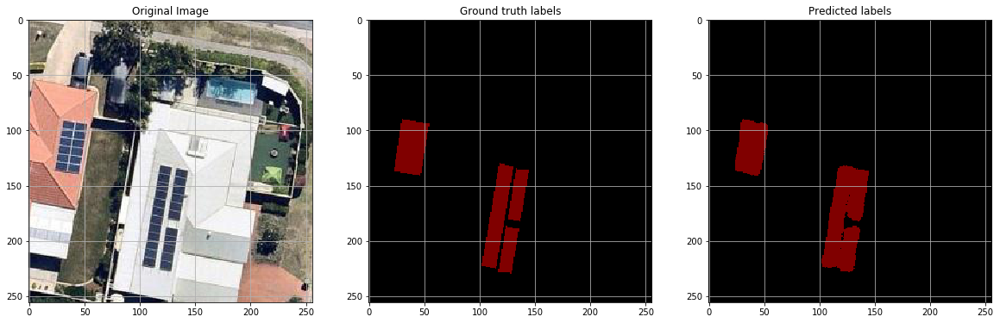

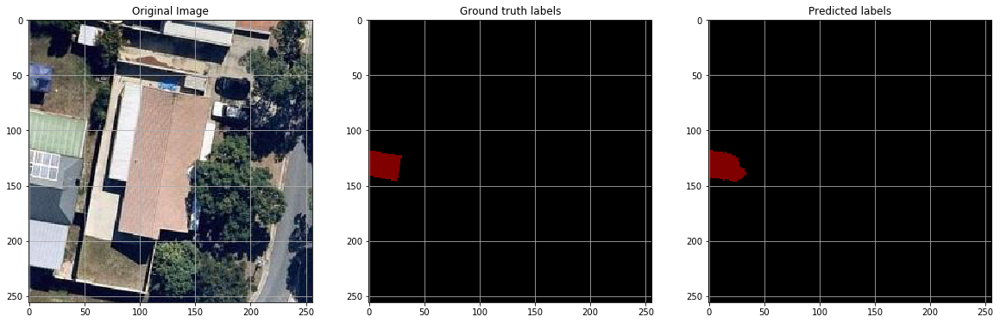

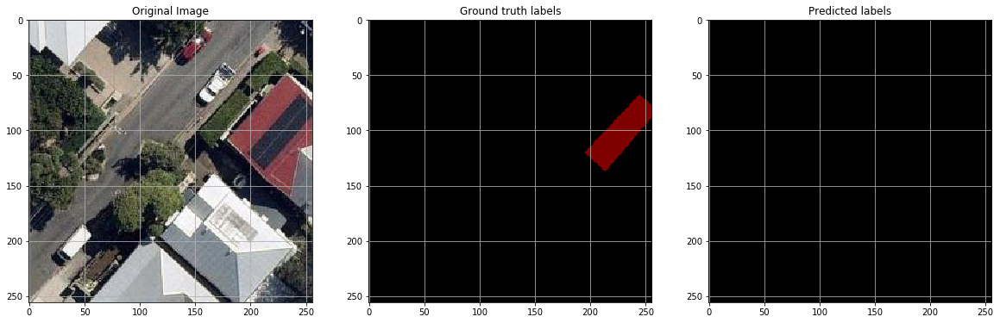

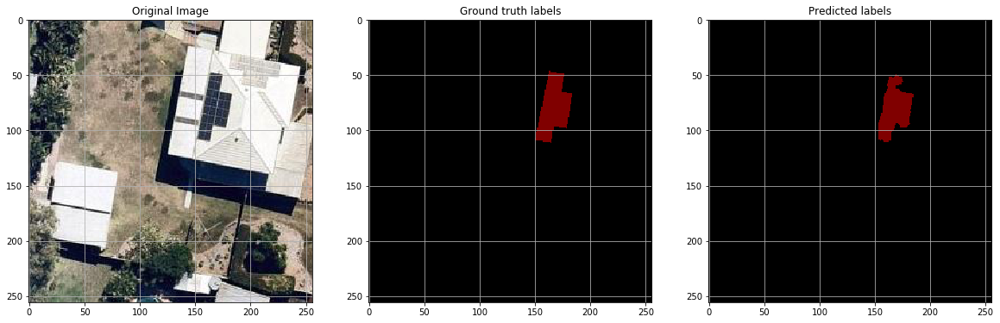

In [9]:
if __name__ == '__main__':
    model=SegNet(input_shape=(256, 256, 3), n_labels=2, model_summary=True)
    batch_size = 8
    #frame_tensors, masks_tensors, frames_list, masks_list=PrepareData.read_images()
    #steps_per_epoch = np.ceil(float(len(frames_list) - round(0.2 * len(frames_list))) / float(batch_size))
    #validation_steps =(float((round(0.2 * len(masks_list)))) / float(batch_size))
    model.load_weights('vgg16_segnet_3.h5')
    num_epochs = 35
#     model.fit(PrepareData.TrainAugmentGenerator(),
#                         validation_data=PrepareData.ValAugmentGenerator(),epochs=num_epochs, 
#                         verbose=1,steps_per_epoch=39, validation_steps=9,callbacks=callbacks)
    #training_gen = PrepareData.TrainAugmentGenerator()
    testing_gen = PrepareData.ValAugmentGenerator()
    flag=8
    while(flag>0):
        flag=flag-1
        batch_img, batch_mask = next(testing_gen)
        #batch_img = next(testing_gen)\
        print(batch_img[0].shape)
        pred_all = model.predict(batch_img)
        np.shape(pred_all)
    #     loss, met=model.evaluate(PrepareData.ValAugmentGenerator(), verbose=1)
    #     print(loss)
    #     print(met)
        for i in range(0, np.shape(pred_all)[0]):
            fig = plt.figure(figsize=(20, 8))

            ax1 = fig.add_subplot(1, 3, 1)
            ax1.imshow(batch_img[i])
            ax1.title.set_text('Original Image')
            ax1.grid(b=None)

            ax2 = fig.add_subplot(1, 3, 2)
            ax2.set_title('Ground truth labels')
            ax2.imshow(PrepareData.onehot_to_rgb(batch_mask[i], PrepareData.id2code))
            ax2.grid(b=None)

            ax3 = fig.add_subplot(1, 3, 3)
            ax3.set_title('Predicted labels')
            ax3.imshow(PrepareData.onehot_to_rgb(pred_all[i], PrepareData.id2code))
            ax3.grid(b=None)

            plt.show()
    #model.save_weights('vgg16_segnet_3.h5', overwrite=True)

In [ ]:
%tensorboard --logdir logs3
#!tensorboard --logdir /tmp/whatever

In [ ]:
!kill 2777
